In [27]:
import scanpy as sc
import scvi
import pandas as pd
import numpy as np
from scipy.io import mmread
import anndata as ad
import os
import tempfile
from pathlib import Path
import mudata as md
import seaborn as sns
import torch
import skmisc

In [28]:
# Set up scanpy
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, facecolor='white')
torch.set_float32_matmul_precision("high")

# Function to load each dataset
def load_seurat_export(i):
    # Load count matrix
    counts = mmread(f"counts/counts_{i}.mtx").T.tocsr()  # Transpose to cells x genes
    
    # Load features
    features = pd.read_csv(f"counts/features_{i}.tsv", sep="\t", header=None, names=["gene_ids", "gene_symbols"])
    
    # Load barcodes  
    barcodes = pd.read_csv(f"counts/barcodes_{i}.tsv", sep="\t", header=None, names=["barcode"])
    
    # Load metadata
    metadata = pd.read_csv(f"counts/metadata_{i}.csv", index_col=0)
    
    # Create AnnData object with raw counts in X
    adata = ad.AnnData(X=counts, obs=metadata, var=features.set_index("gene_ids"))
    adata.var_names = features["gene_symbols"].values
    adata.obs_names = barcodes["barcode"].values
    
    return adata

In [47]:
# Load the three datasets
adata1 = load_seurat_export(1)
adata2 = load_seurat_export(2) 
adata3 = load_seurat_export(3)

# Add batch labels with actual condition names
adata1.obs['batch'] = 'Standard_BM'
adata2.obs['batch'] = 'TGF_beta_treated'
adata3.obs['batch'] = 'IL_10_treated'

# Concatenate datasets
adata = sc.concat([adata1, adata2, adata3], label='batch', keys=['Standard_BM', 'TGF_beta_treated', 'IL_10_treated'])
adata.write('concatenated_datasets.h5ad')

/Users/arjun/miniconda3/envs/scanpy-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [48]:
#preprocessing
adata.layers['counts'] = adata.X.copy()

sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

# Calculate QC metrics
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

# Normalize and log transform
adata.raw = adata
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2000,
    flavor="seurat_v3",
    layer="counts",
    subset=True,
    batch_key="batch",  # Change depending on the batch key for your dataset
)

adata.write_h5ad("preprocessed.h5ad")

/Users/arjun/miniconda3/envs/scanpy-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/arjun/miniconda3/envs/scanpy-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


filtered out 17568 genes that are detected in less than 3 cells


/Users/arjun/miniconda3/envs/scanpy-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


/Users/arjun/miniconda3/envs/scanpy-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


computing PCA
    with n_comps=50


/Users/arjun/miniconda3/envs/scanpy-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/arjun/miniconda3/envs/scanpy-env/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:05)


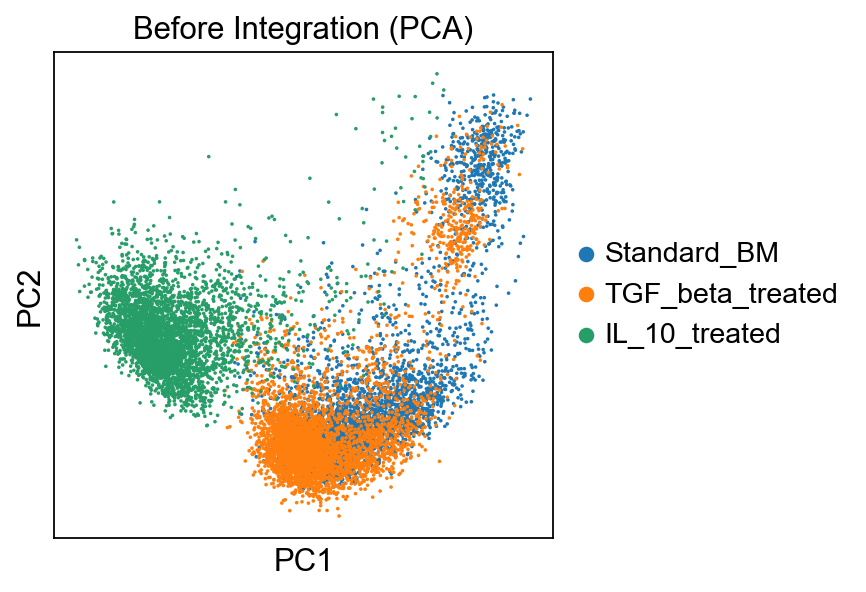

In [82]:
preproc = sc.read(
    'preprocessed.h5ad'
)
sc.pp.pca(preproc, use_highly_variable=False)
sc.pl.pca(preproc, color='batch', title='Before Integration (PCA)')


In [49]:
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="batch")
model = scvi.model.SCVI(adata, n_layers=1, n_latent=75, gene_likelihood="nb")
model.train(max_epochs = 300)

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/Users/arjun/miniconda3/envs/scanpy-env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:177: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/Users/arjun/miniconda3/envs/scanpy-env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=9` in the `DataLoader` to improve performance.


Epoch 300/300: 100%|██████████| 300/300 [09:20<00:00,  1.59s/it, v_num=1, train_loss_step=780, train_loss_epoch=758]

`Trainer.fit` stopped: `max_epochs=300` reached.


Epoch 300/300: 100%|██████████| 300/300 [09:20<00:00,  1.87s/it, v_num=1, train_loss_step=780, train_loss_epoch=758]


In [ ]:
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = model.get_latent_representation()
sc.pp.neighbors(adata, use_rep=SCVI_LATENT_KEY)
sc.tl.leiden(adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


In [ ]:
#adata.write('integrated.h5ad')

#adata = sc.read(
#    'integrated.h5ad'
#)

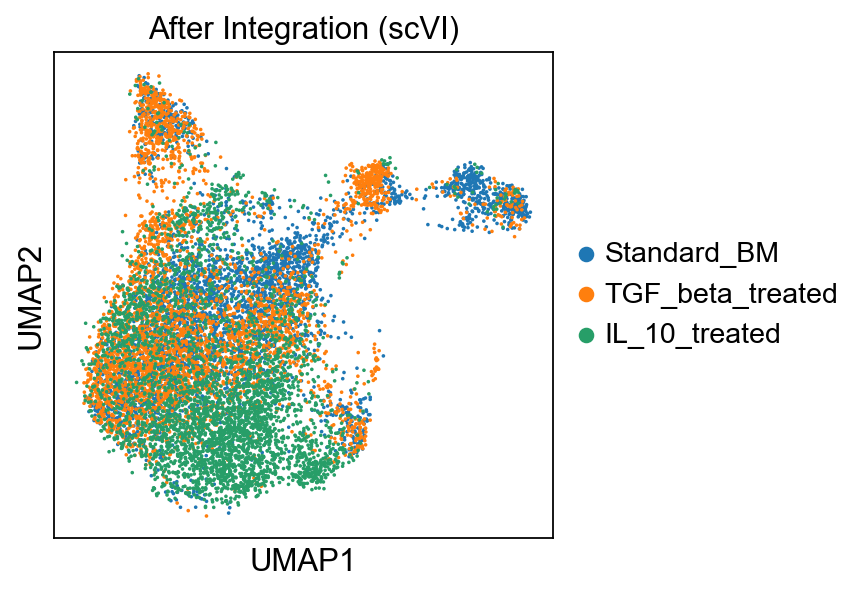

=== Testing different clustering resolutions ===
running Leiden clustering
    finished: found 2 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
Resolution 0.1: 2 clusters
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
Resolution 0.3: 4 clusters
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:01)
Resolution 0.4: 6 clusters
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:01)
Resolution 0.5: 7 clusters
running Leiden clustering
    finished: found 9 clusters and added
    'leiden_0.8', the cluster labels (adata.obs, categorical) (0:00:01)
Resolution 0.8: 9 clusters
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_1.0', the cluster labels (adata.obs, cate

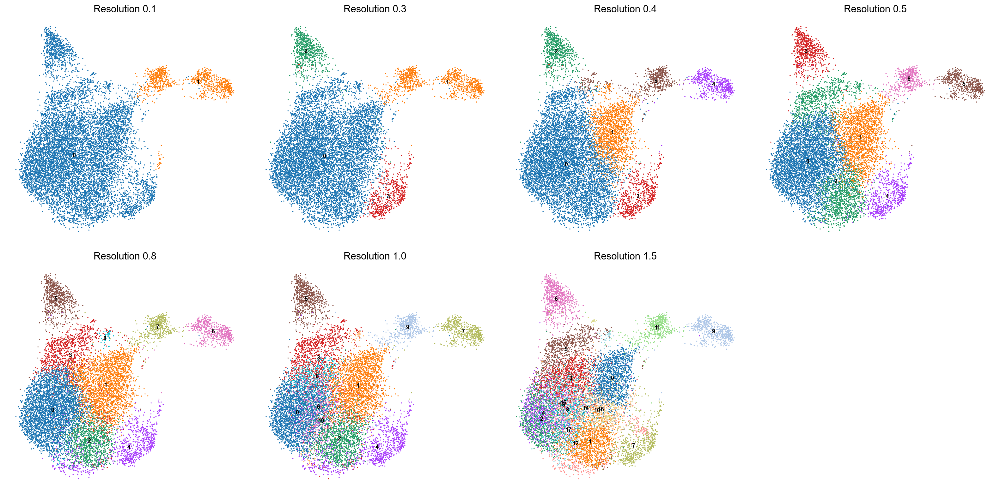

Found 63 DC markers in dataset: ['Clec4n', 'Ctsl', 'Ctsb', 'Mmp12', 'Ctss', 'Gpnmb', 'Igf1', 'Mmp14', 'Chil3', 'Car4', 'Fabp4', 'Fabp5', 'Mgl2', 'Ccl17', 'Cd52', 'Cd74', 'Crip1', 'H2-Aa', 'H2-DMb1', 'Fn1', 'Npy', 'H2-D1', 'Rhob', 'Ifit1', 'Rsad2', 'Slfn5', 'Mx1', 'Ifi204', 'Rnf213', 'Ifit2', 'Cbln1', 'Gm2694', 'Lpl', 'AA467197', 'Inhba', 'Mtpn', 'Ccl22', 'Ccr7', 'Cst3', 'Fscn1', 'Ccl5', 'Tmem123', 'Pkib', 'Il4i1', 'H2-Eb1', 'H2-Ab1', 'Aif1', 'Napsa', 'Ifitm1', 'Stmn1', 'Pclaf', 'Top2a', 'Hmgb2', 'Mki67', 'Birc5', 'Tuba1b', 'S100a8', 'Lcn2', 'S100a9', 'Ly6c2', 'Wfdc21', 'Thbs1', 'Hp']

=== Analysis for leiden_0.3 ===
ranking genes
    finished: added to `.uns['rank_genes_leiden_0.3']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group id

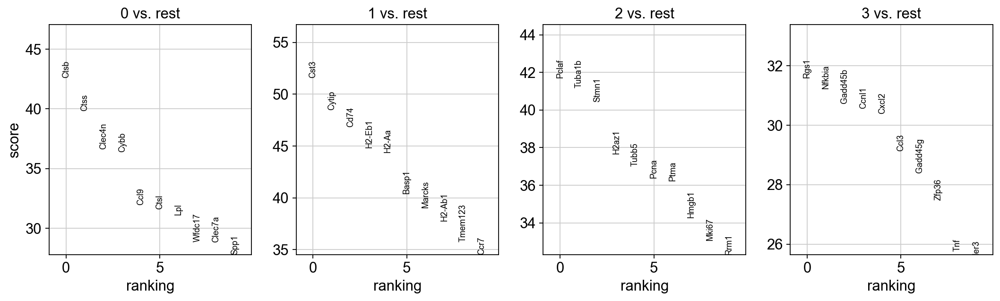

Cluster composition by batch (proportions):
batch       Standard_BM  TGF_beta_treated  IL_10_treated
leiden_0.3                                              
0                 0.315             0.317          0.369
1                 0.584             0.360          0.055
2                 0.310             0.618          0.072
3                 0.229             0.252          0.519


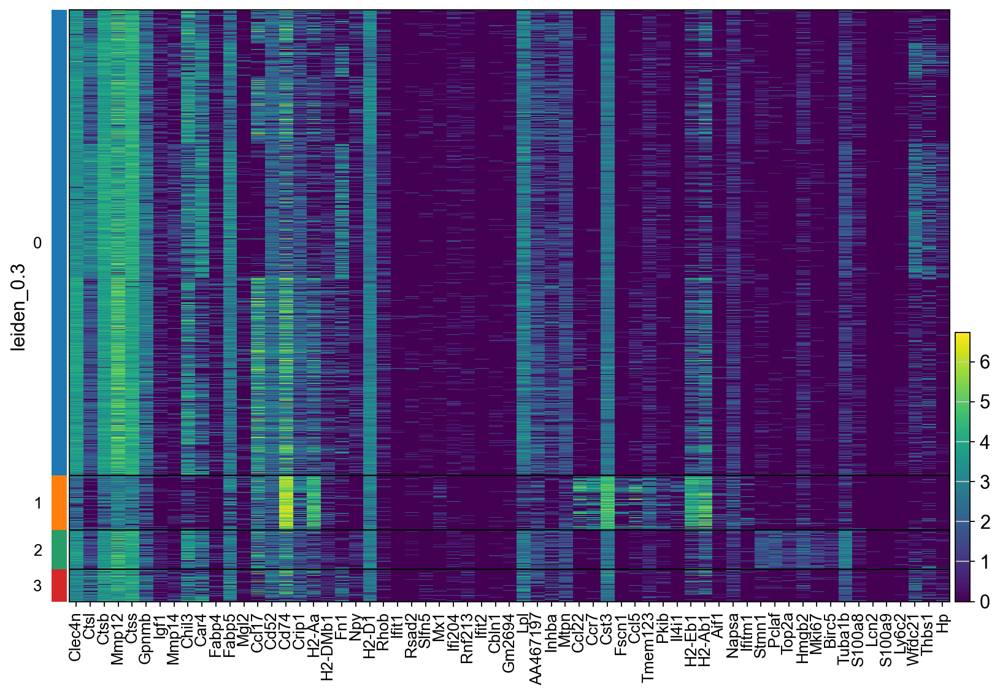

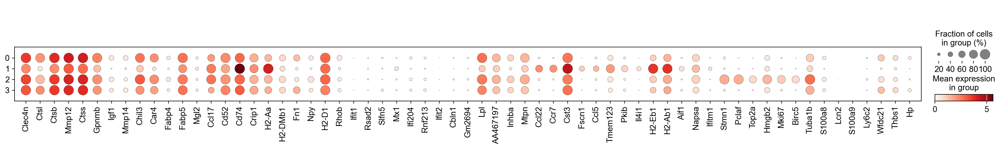

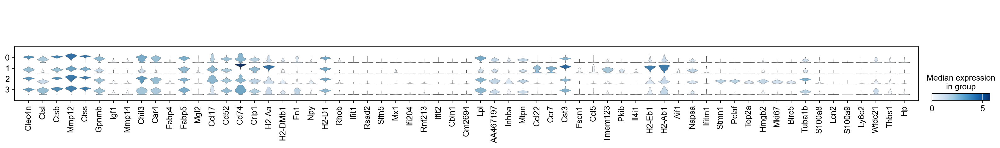


Top 5 markers for cluster 0:
 names    scores     pvals_adj
  Ctsb 42.605652  0.000000e+00
  Ctss 39.819748  0.000000e+00
Clec4n 36.610847 9.611238e-291
  Cybb 36.370399 5.003237e-287
  Ccl9 31.969671 8.226720e-222

Top 5 markers for cluster 1:
 names    scores  pvals_adj
  Cst3 51.598869        0.0
 Cytip 48.463612        0.0
  Cd74 46.848560        0.0
H2-Eb1 44.817059        0.0
 H2-Aa 44.378044        0.0

Top 5 markers for cluster 2:
 names    scores     pvals_adj
 Pclaf 41.716431  0.000000e+00
Tuba1b 41.180893  0.000000e+00
 Stmn1 40.430389  0.000000e+00
 H2az1 37.663792 9.728614e-308
 Tubb5 37.011627 2.978050e-297

Top 5 markers for cluster 3:
  names    scores     pvals_adj
   Rgs1 31.595293 8.569618e-216
 Nfkbia 31.224010 5.031768e-211
Gadd45b 30.726686 1.670405e-204
  Ccnl1 30.561893 1.965063e-202
  Cxcl2 30.389202 3.051757e-200


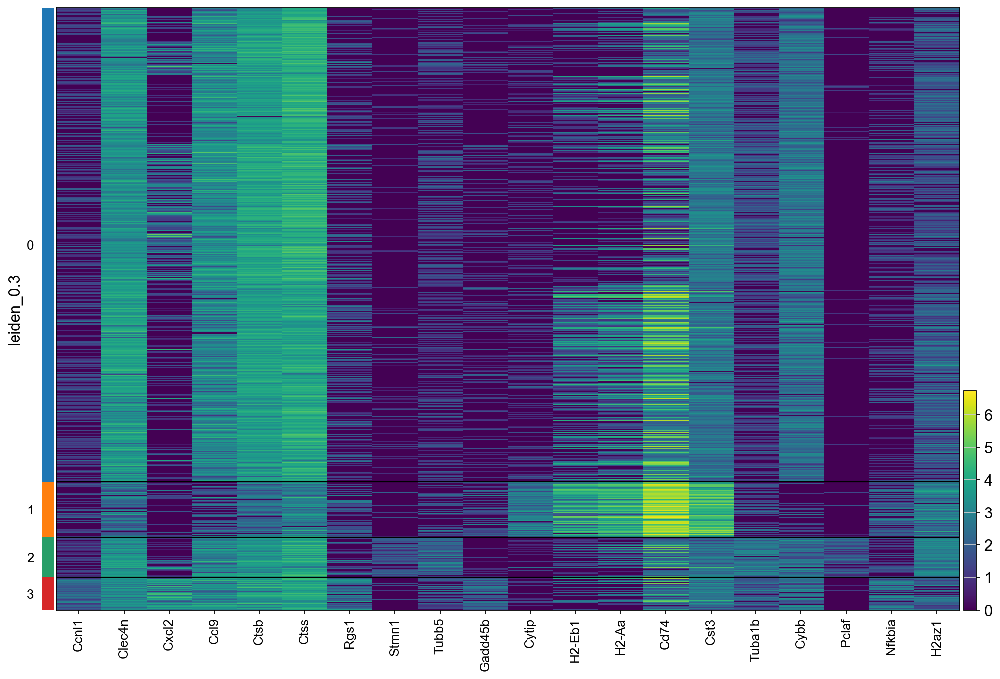


=== Analysis for leiden_0.4 ===
ranking genes
    finished: added to `.uns['rank_genes_leiden_0.4']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


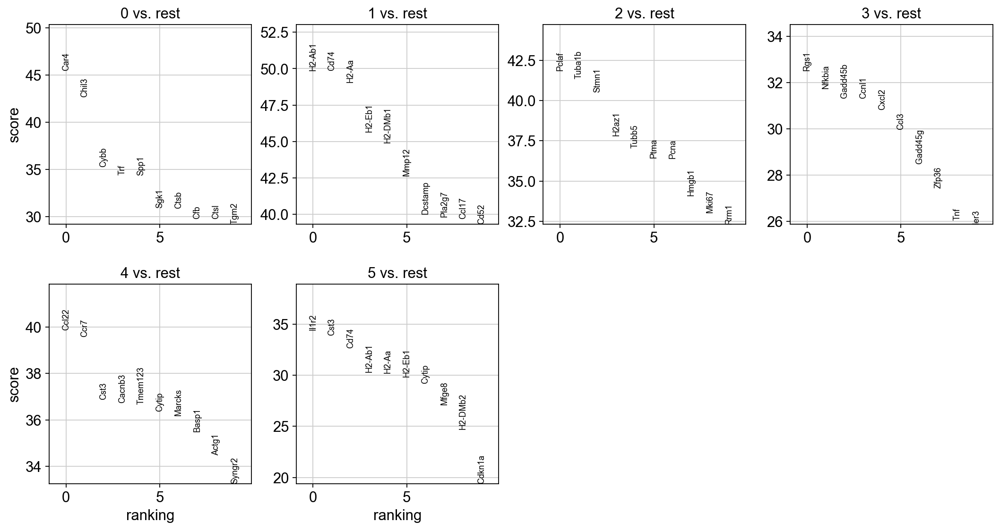

Cluster composition by batch (proportions):
batch       Standard_BM  TGF_beta_treated  IL_10_treated
leiden_0.4                                              
0                 0.264             0.328          0.408
1                 0.553             0.278          0.169
2                 0.308             0.621          0.071
3                 0.216             0.252          0.533
4                 0.795             0.146          0.059
5                 0.281             0.533          0.185


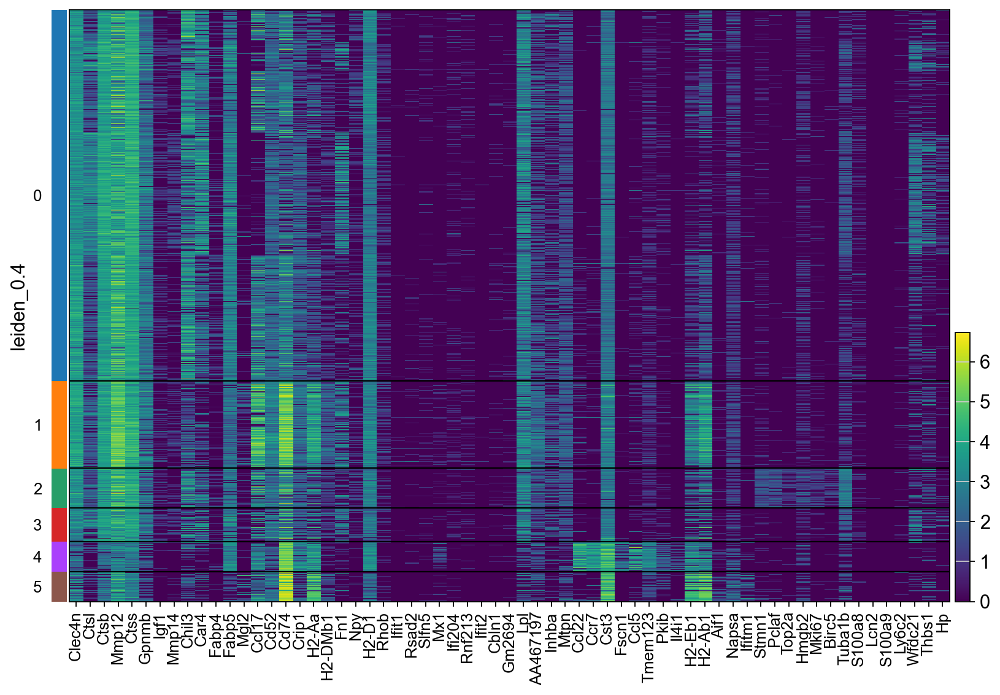

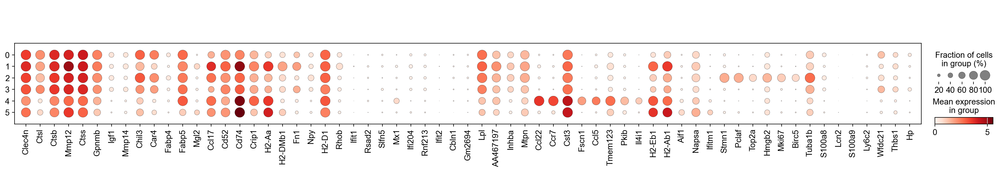

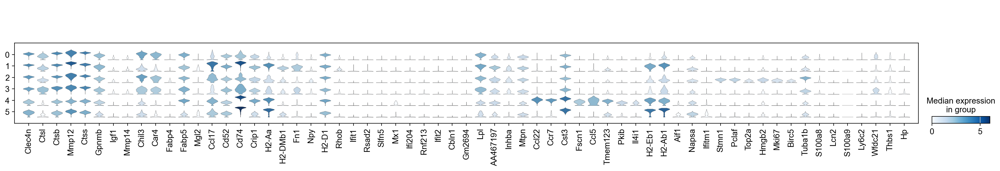


Top 5 markers for cluster 0:
names    scores     pvals_adj
 Car4 45.467323  0.000000e+00
Chil3 42.651928  0.000000e+00
 Cybb 35.258175 5.713918e-270
  Trf 34.394115 6.175186e-257
 Spp1 34.350803 2.490873e-256

Top 5 markers for cluster 1:
  names    scores  pvals_adj
 H2-Ab1 49.873806        0.0
   Cd74 49.871838        0.0
  H2-Aa 49.064491        0.0
 H2-Eb1 45.651134        0.0
H2-DMb1 44.898598        0.0

Top 5 markers for cluster 2:
 names    scores     pvals_adj
 Pclaf 41.862553  0.000000e+00
Tuba1b 41.365829  0.000000e+00
 Stmn1 40.512569  0.000000e+00
 H2az1 37.820930  0.000000e+00
 Tubb5 37.052132 6.637613e-298

Top 5 markers for cluster 3:
  names    scores     pvals_adj
   Rgs1 32.524448 9.623932e-229
 Nfkbia 31.746164 3.586846e-218
Gadd45b 31.328808 1.260938e-212
  Ccnl1 31.308937 1.763248e-212
  Cxcl2 30.825895 4.715629e-206

Top 5 markers for cluster 4:
  names    scores     pvals_adj
  Ccl22 39.866707  0.000000e+00
   Ccr7 39.580601  0.000000e+00
   Cst3 36.870186 9.25

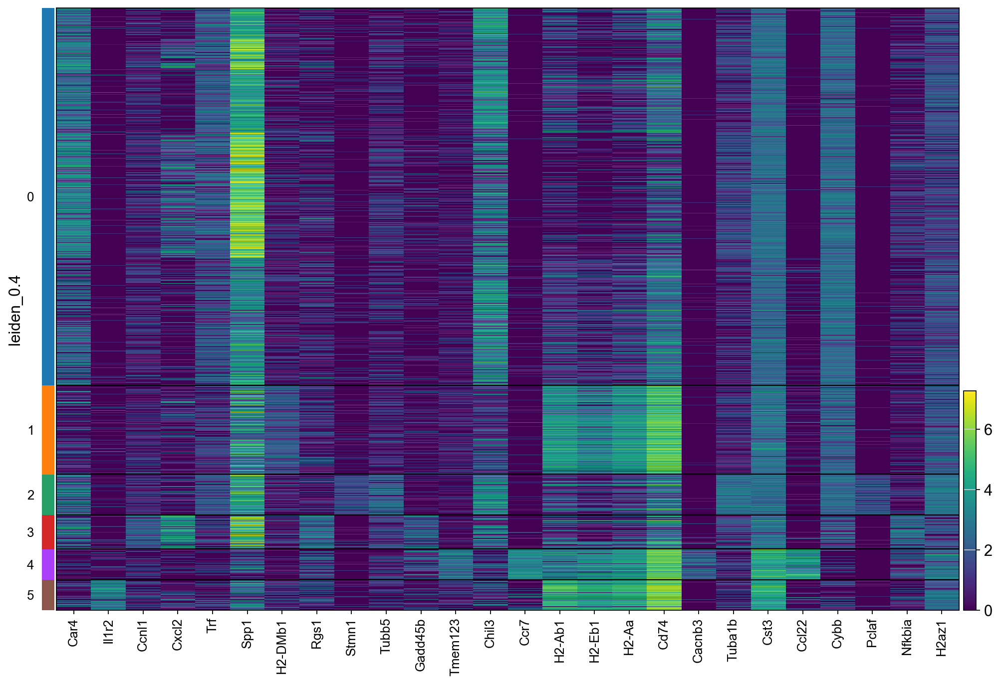


=== Analysis for leiden_0.5 ===
ranking genes
    finished: added to `.uns['rank_genes_leiden_0.5']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


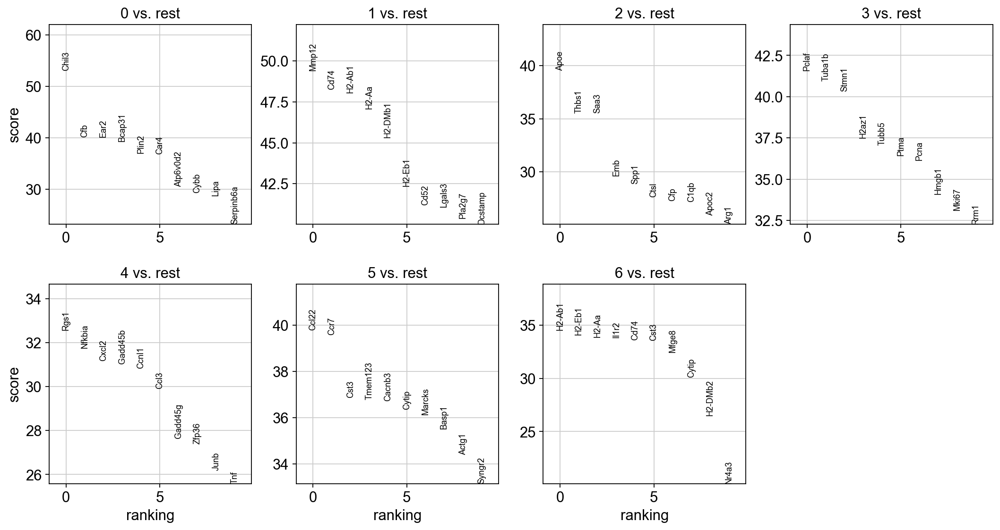

Cluster composition by batch (proportions):
batch       Standard_BM  TGF_beta_treated  IL_10_treated
leiden_0.5                                              
0                 0.315             0.392          0.293
1                 0.501             0.274          0.225
2                 0.133             0.183          0.684
3                 0.311             0.616          0.073
4                 0.215             0.246          0.539
5                 0.793             0.148          0.059
6                 0.302             0.658          0.041


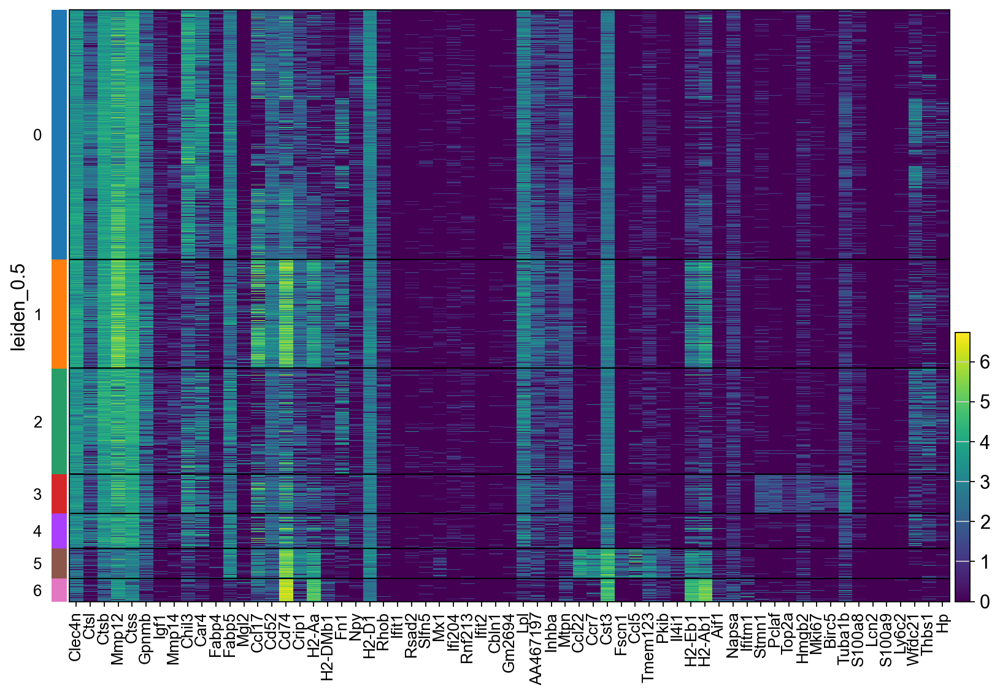

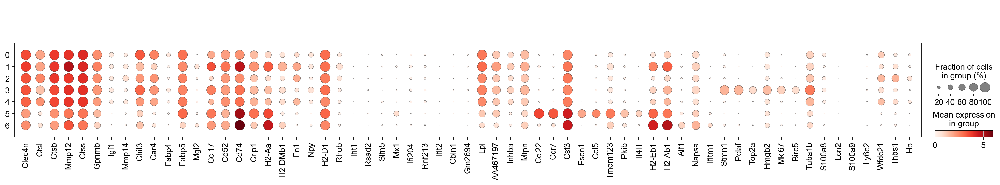

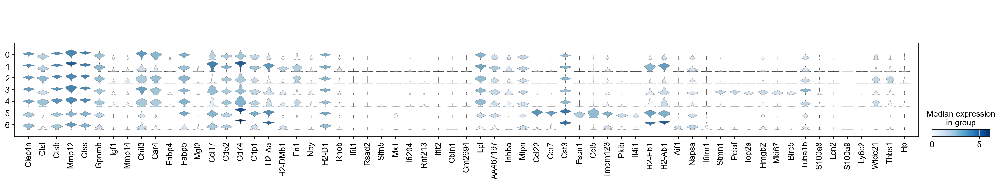


Top 5 markers for cluster 0:
 names    scores     pvals_adj
 Chil3 53.068905  0.000000e+00
   Cfb 40.116901  0.000000e+00
  Ear2 40.066120  0.000000e+00
Bcap31 39.297344  0.000000e+00
 Plin2 36.950745 2.024456e-296

Top 5 markers for cluster 1:
  names    scores  pvals_adj
  Mmp12 49.422489        0.0
   Cd74 48.257046        0.0
 H2-Ab1 48.060268        0.0
  H2-Aa 47.091949        0.0
H2-DMb1 45.323490        0.0

Top 5 markers for cluster 2:
names    scores     pvals_adj
 Apoe 39.553608  0.000000e+00
Thbs1 35.547653 8.689417e-274
 Saa3 35.537342 8.689417e-274
  Emb 29.647295 1.225005e-190
 Spp1 28.871012 7.888565e-181

Top 5 markers for cluster 3:
 names    scores     pvals_adj
 Pclaf 41.587639  0.000000e+00
Tuba1b 40.958714  0.000000e+00
 Stmn1 40.318176  0.000000e+00
 H2az1 37.487980 7.229712e-305
 Tubb5 37.055870 5.778703e-298

Top 5 markers for cluster 4:
  names    scores     pvals_adj
   Rgs1 32.572685 1.999211e-229
 Nfkbia 31.756542 2.579155e-218
  Cxcl2 31.168482 1.899883e-

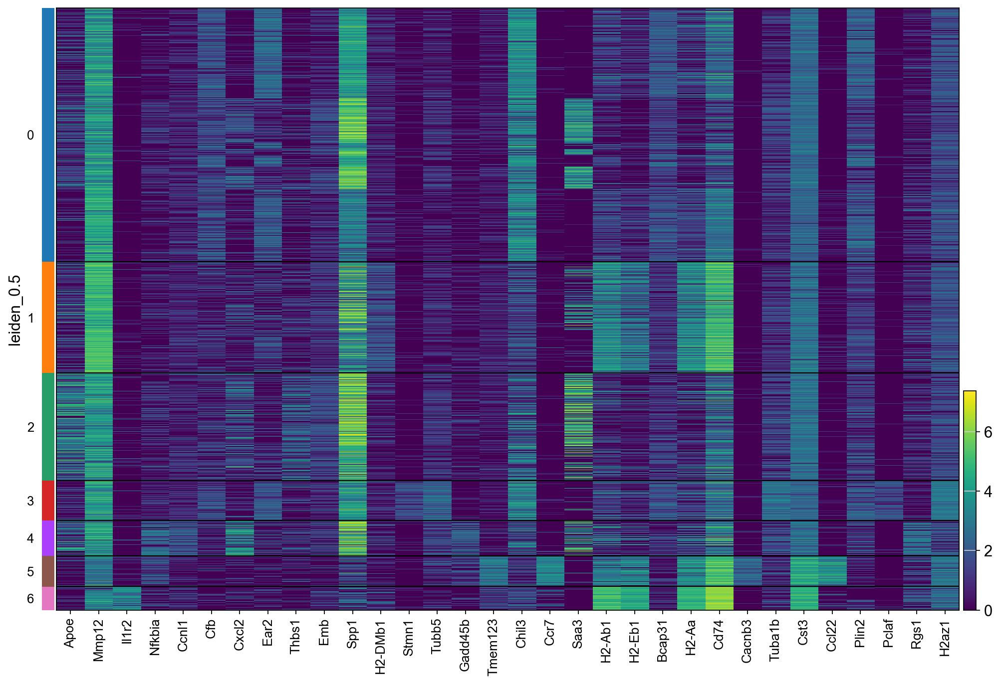


=== Analysis for leiden_0.8 ===
ranking genes
    finished: added to `.uns['rank_genes_leiden_0.8']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


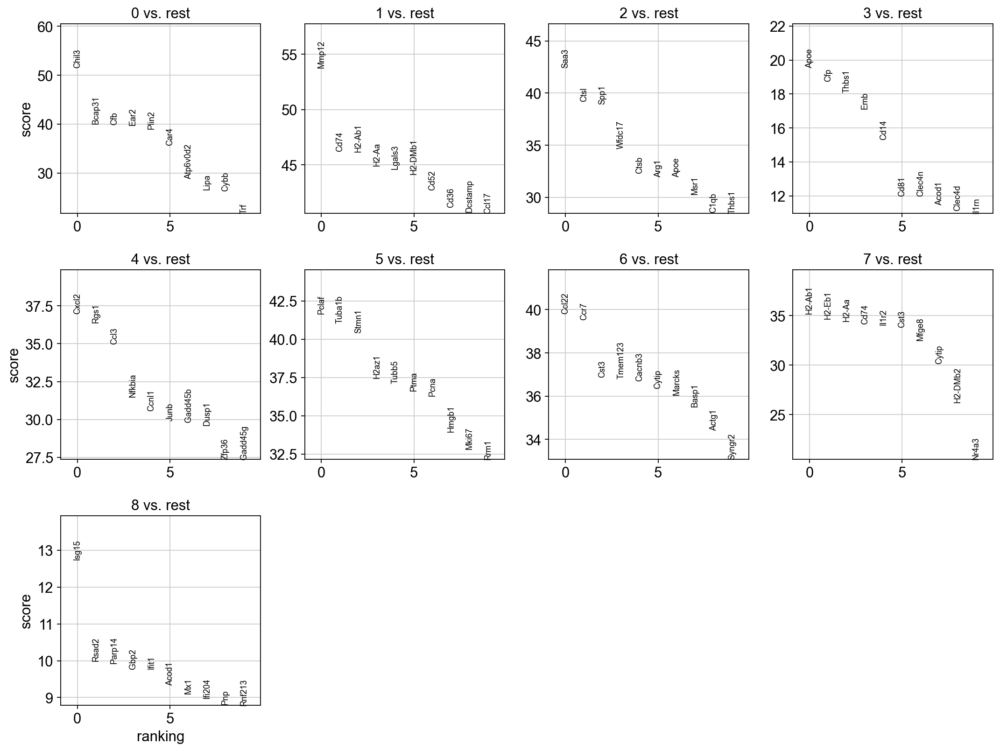

Cluster composition by batch (proportions):
batch       Standard_BM  TGF_beta_treated  IL_10_treated
leiden_0.8                                              
0                 0.303             0.423          0.274
1                 0.511             0.290          0.199
2                 0.058             0.073          0.870
3                 0.248             0.332          0.419
4                 0.199             0.202          0.599
5                 0.308             0.617          0.075
6                 0.793             0.148          0.059
7                 0.306             0.643          0.051
8                 0.523             0.215          0.262


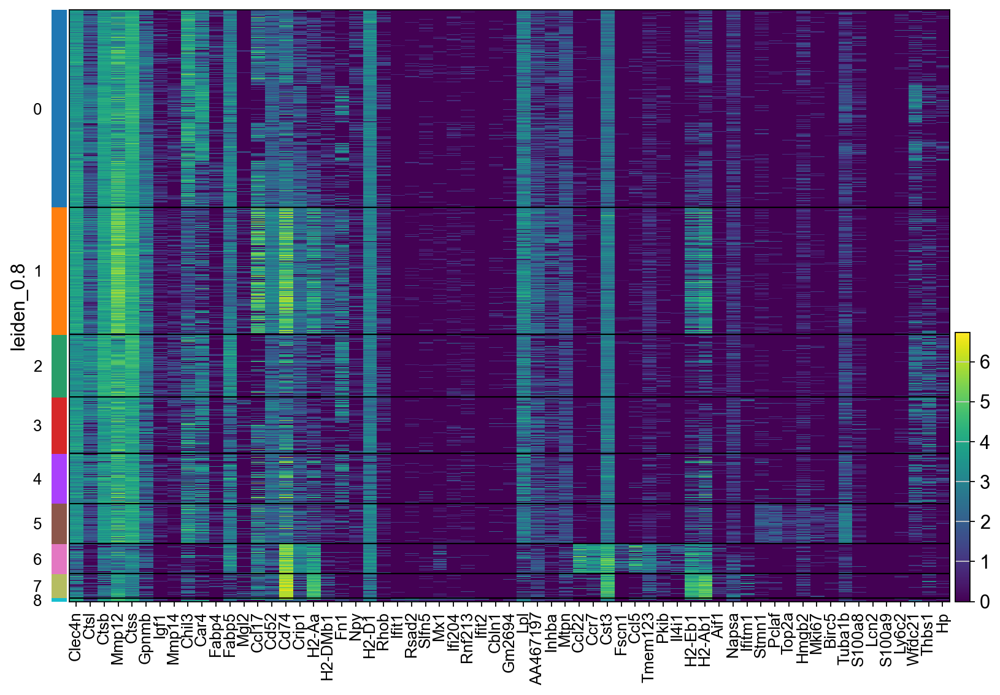

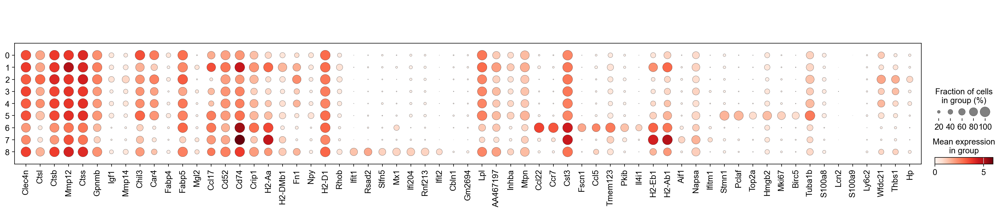

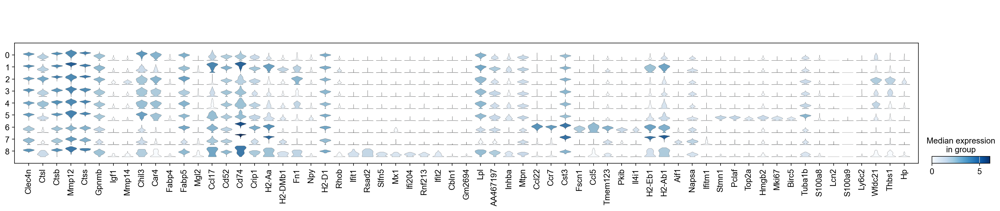


Top 5 markers for cluster 0:
 names    scores  pvals_adj
 Chil3 51.544666        0.0
Bcap31 40.129349        0.0
   Cfb 39.930576        0.0
  Ear2 39.772682        0.0
 Plin2 39.058147        0.0

Top 5 markers for cluster 1:
 names    scores  pvals_adj
 Mmp12 53.801422        0.0
  Cd74 46.220314        0.0
H2-Ab1 46.214725        0.0
 H2-Aa 44.925400        0.0
Lgals3 44.633427        0.0

Top 5 markers for cluster 2:
 names    scores     pvals_adj
  Saa3 42.441219  0.000000e+00
  Ctsl 39.192081  0.000000e+00
  Spp1 38.949978  0.000000e+00
Wfdc17 34.692745 5.067441e-261
  Ctsb 32.340649 6.259952e-227

Top 5 markers for cluster 3:
names    scores    pvals_adj
 Apoe 19.551849 2.652246e-82
  Cfp 18.745687 6.998107e-76
Thbs1 18.096500 8.489295e-71
  Emb 17.137642 1.413465e-63
 Cd14 15.307364 9.753727e-51

Top 5 markers for cluster 4:
 names    scores     pvals_adj
 Cxcl2 36.984894 4.006049e-296
  Rgs1 36.391857 5.726899e-287
  Ccl3 34.966240 4.890883e-265
Nfkbia 31.493696 5.298090e-215

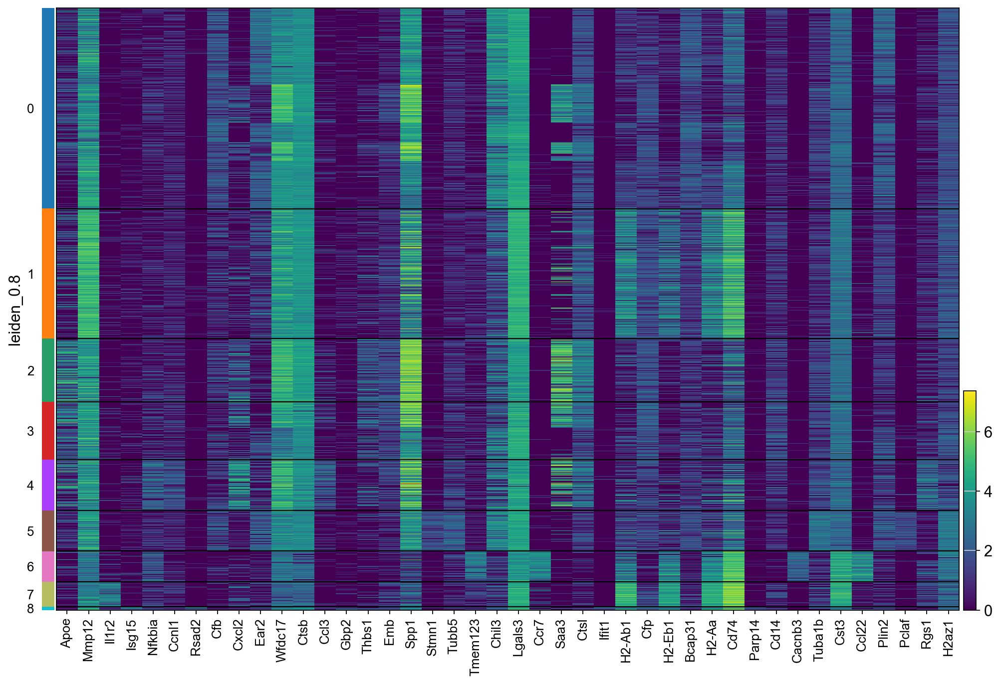


=== Analysis for leiden_1.0 ===
ranking genes
    finished: added to `.uns['rank_genes_leiden_1.0']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


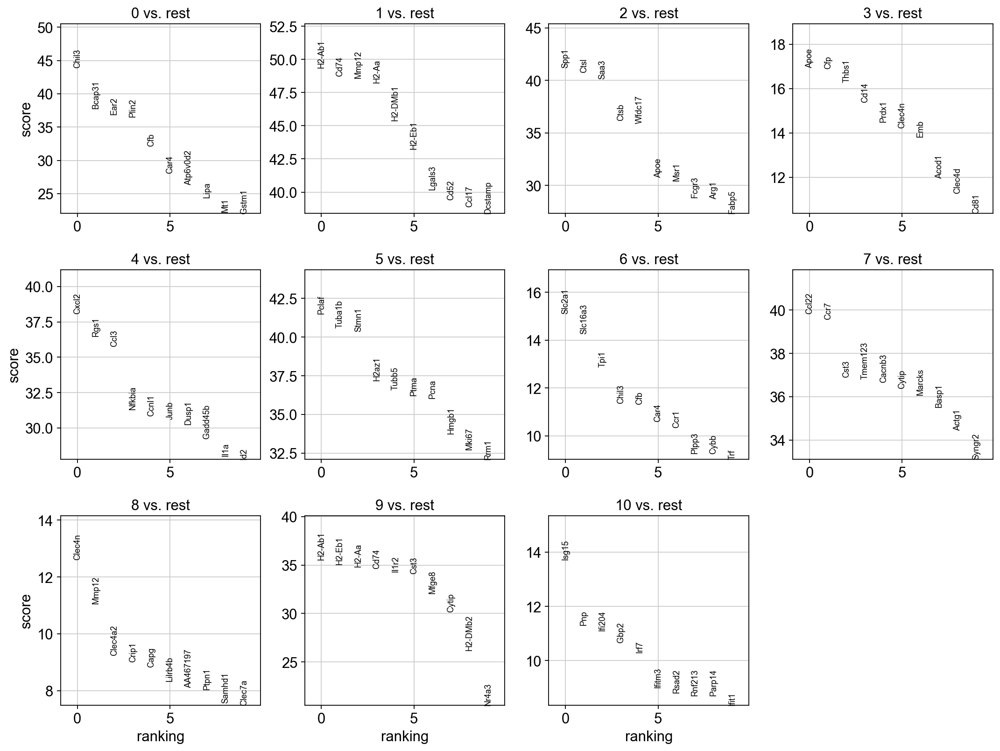

Cluster composition by batch (proportions):
batch       Standard_BM  TGF_beta_treated  IL_10_treated
leiden_1.0                                              
0                 0.319             0.452          0.229
1                 0.497             0.313          0.190
2                 0.079             0.112          0.809
3                 0.292             0.342          0.367
4                 0.186             0.197          0.617
5                 0.306             0.613          0.081
6                 0.275             0.378          0.348
7                 0.794             0.147          0.059
8                 0.449             0.198          0.354
9                 0.321             0.627          0.052
10                0.350             0.320          0.330


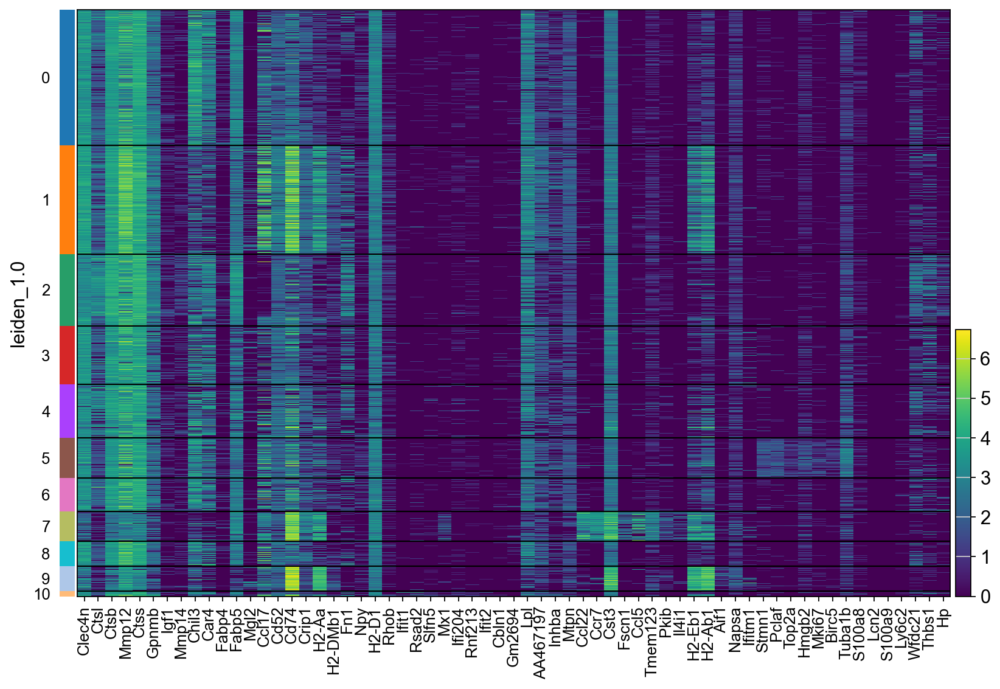

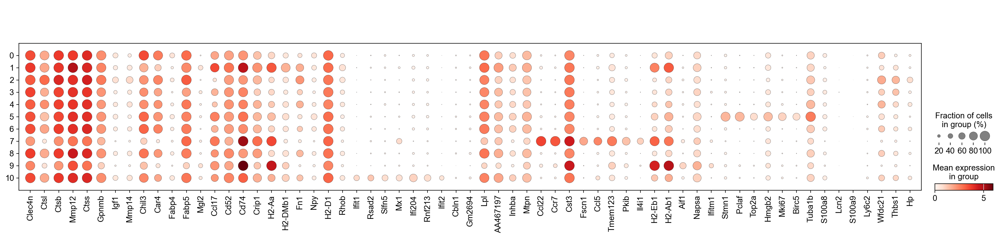

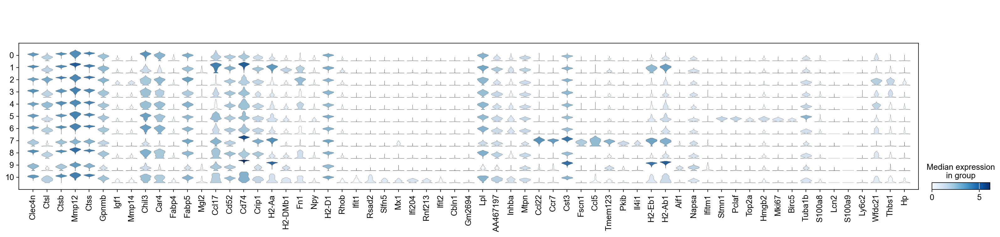


Top 5 markers for cluster 0:
 names    scores     pvals_adj
 Chil3 43.928890  0.000000e+00
Bcap31 37.829140  0.000000e+00
  Ear2 36.910370 2.100362e-295
 Plin2 36.569592 4.353688e-290
   Cfb 32.130386 5.533388e-224

Top 5 markers for cluster 1:
  names    scores  pvals_adj
 H2-Ab1 49.383869        0.0
   Cd74 48.746208        0.0
  Mmp12 48.589172        0.0
  H2-Aa 48.267345        0.0
H2-DMb1 45.400429        0.0

Top 5 markers for cluster 2:
 names    scores     pvals_adj
  Spp1 41.208698  0.000000e+00
  Ctsl 40.777752  0.000000e+00
  Saa3 40.134102  0.000000e+00
  Ctsb 36.184109 5.412928e-284
Wfdc17 35.916771 6.688329e-280

Top 5 markers for cluster 3:
names    scores    pvals_adj
 Apoe 16.943512 7.163483e-62
  Cfp 16.906075 1.159595e-61
Thbs1 16.291142 2.281597e-57
 Cd14 15.386022 3.385753e-51
Prdx1 14.493500 1.775732e-45

Top 5 markers for cluster 4:
 names    scores     pvals_adj
 Cxcl2 38.086643  0.000000e+00
  Rgs1 36.512859 6.931866e-289
  Ccl3 35.780239 1.494252e-277
Nfkbia

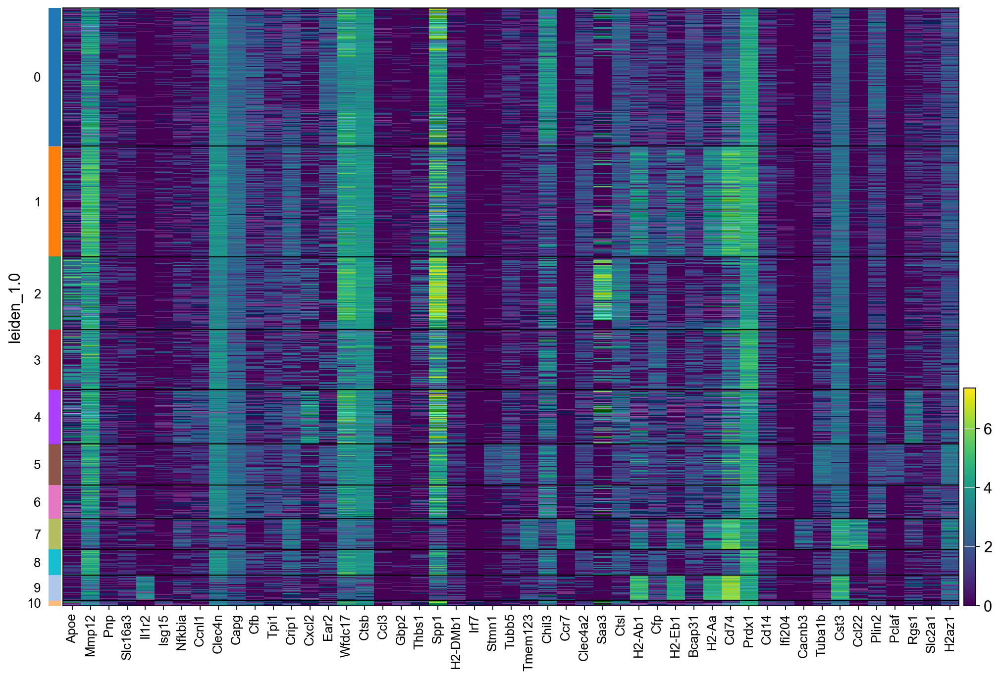

IndexError: index 4 is out of bounds for axis 0 with size 4

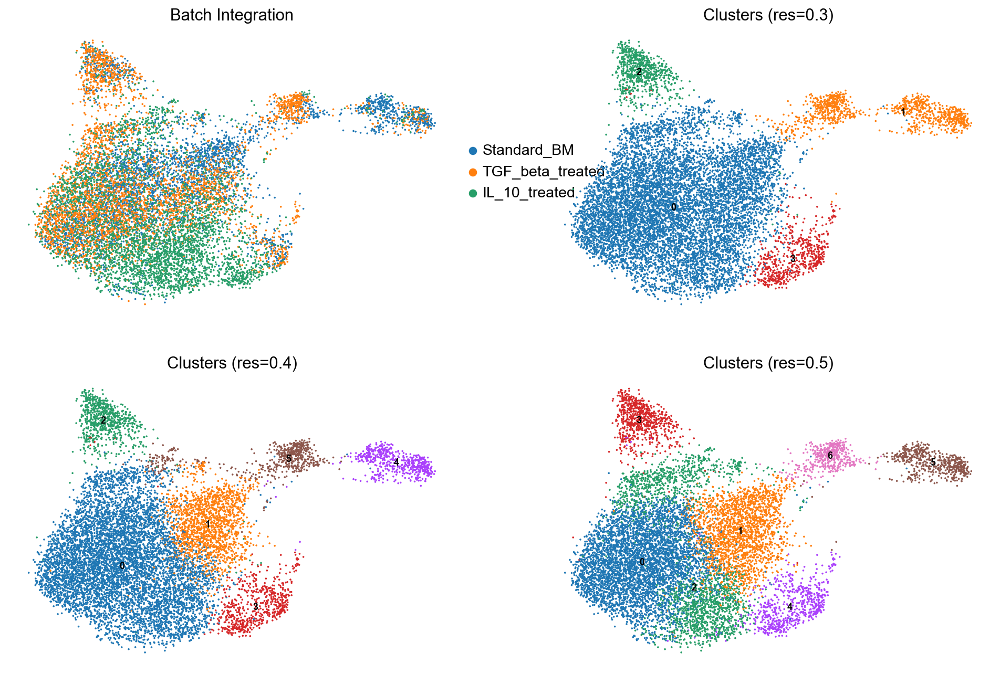

In [ ]:
import matplotlib.pyplot as plt
# Plot after integration
sc.pl.umap(adata, color='batch', title='After Integration (scVI)')

# Test different clustering resolutions
resolutions = [0.1, 0.3, 0.4, 0.5, 0.8, 1.0, 1.5]

print("=== Testing different clustering resolutions ===")
for res in resolutions:
    cluster_key = f'leiden_{res}'
    sc.tl.leiden(adata, key_added=cluster_key, resolution=res)
    n_clusters = len(adata.obs[cluster_key].cat.categories)
    print(f"Resolution {res}: {n_clusters} clusters")

# Plot all resolutions
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()
for i, res in enumerate(resolutions):
    cluster_key = f'leiden_{res}'
    sc.pl.umap(adata, color=cluster_key, ax=axes[i], show=False, frameon=False, 
               legend_loc='on data', legend_fontsize=8)
    axes[i].set_title(f'Resolution {res}')
# Remove empty subplot
axes[-1].remove()
plt.tight_layout()
plt.show()

# Define DC marker genes
dc_markers = [
    "Clec4n", "Ctsl", "Ctsb", "Mmp12", "Ctss", "Lyz2", "Gpnmb", "Igf1", "Mmp14",
    "Chil3", "Car4", "Fabp4", "Fabp5", "Cd9", "Ctsd", "Plek", "Fth1", "Mgl2", "Ccl17",
    "Cd52", "Cd74", "Crip1", "H2-Aa", "H2-DMb1", "Fn1", "Sqstm1", "Esd", "Npy",
    "H2-D1", "Hist1h2bc", "Tnfaip2", "Rhob", "Ifit1", "Rsad2", "Lsg15", "Slfn5", "Mx1",
    "Ifi204", "Rnf213", "Ifit2", "Cbln1", "Gm2694", "Lpl", "AA467197", "Inhba",
    "Mtpn", "Ccl22", "Ccr7", "Cst3", "Fscn1", "Ccl5", "Tmem123", "Pkib", "Il4i1", "H2-Eb1",
    "H2-Ab1", "Aif1", "Napsa", "Ifitm1", "Stmn1", "Pclaf",
    "Top2a", "Hmgb2", "Mki67", "Birc5", "H2afz", "Tuba1b", "S100a8", "Lcn2", "S100a9",
    "Ly6c2", "Gm5483", "Wfdc21", "Thbs1", "Hp"
]

# Filter to genes present in data
dc_markers_filtered = [gene for gene in dc_markers if gene in adata.var_names]
print(f"Found {len(dc_markers_filtered)} DC markers in dataset: {dc_markers_filtered}")

# Analyze each clustering resolution
def analyze_clustering(adata, cluster_key, dc_markers_filtered):
    print(f"\n=== Analysis for {cluster_key} ===")
    
    # Find marker genes
    sc.tl.rank_genes_groups(adata, cluster_key, method='wilcoxon', use_raw=False, 
                           key_added=f'rank_genes_{cluster_key}')
    
    # Plot rank genes
    sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False, 
                           key=f'rank_genes_{cluster_key}')
    
    # Get marker dataframe
    marker_df = sc.get.rank_genes_groups_df(adata, group=None, key=f'rank_genes_{cluster_key}')
    
    # Show cluster composition by batch
    cluster_batch = pd.crosstab(adata.obs[cluster_key], adata.obs['batch'], normalize='index')
    print(f"Cluster composition by batch (proportions):")
    print(cluster_batch.round(3))
    
    # Plot DC markers if available
    if dc_markers_filtered:
        # Heatmap
        sc.pl.heatmap(adata, dc_markers_filtered, groupby=cluster_key, 
                     use_raw=False, show_gene_labels=True, 
                     figsize=(12, 8))
        
        # Dotplot
        sc.pl.dotplot(adata, dc_markers_filtered, groupby=cluster_key, 
                     use_raw=False)
        
        # Stacked violin
        sc.pl.stacked_violin(adata, dc_markers_filtered, groupby=cluster_key, 
                           use_raw=False)
    
    # Get top 5 markers per cluster
    top_markers = {}
    all_top_markers = []
    
    for cluster in adata.obs[cluster_key].cat.categories:
        cluster_markers = marker_df[marker_df['group'] == cluster].head(5)
        top_markers[cluster] = cluster_markers['names'].tolist()
        all_top_markers.extend(cluster_markers['names'].tolist())
        print(f"\nTop 5 markers for cluster {cluster}:")
        print(cluster_markers[['names', 'scores', 'pvals_adj']].to_string(index=False))
    
    # Remove duplicates and filter to available genes
    all_top_markers = list(set(all_top_markers))
    all_top_markers = [gene for gene in all_top_markers if gene in adata.raw.var_names]
    
    # Plot heatmap of top markers
    if all_top_markers:
        sc.pl.heatmap(adata, all_top_markers, groupby=cluster_key, 
                     use_raw=False, show_gene_labels=True, 
                     figsize=(15, 10))
    
    return marker_df, cluster_batch, top_markers

# Analyze key resolutions
key_resolutions = [0.3, 0.4, 0.5, 0.8, 1.0]
analysis_results = {}

for res in key_resolutions:
    cluster_key = f'leiden_{res}'
    marker_df, cluster_batch, top_markers = analyze_clustering(adata, cluster_key, dc_markers_filtered)
    analysis_results[cluster_key] = {
        'markers': marker_df,
        'batch_composition': cluster_batch,
        'top_markers': top_markers
    }

# Summary plot: Show batch integration quality
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()

sc.pl.umap(adata, color='batch', ax=axes[0], show=False, frameon=False)
axes[0].set_title('Batch Integration')


# Save final integrated data
adata.write('integrated_data.h5ad')

print("\n=== Analysis Complete ===")
print("Files generated:")
print("- markers_leiden_*.csv: Marker gene tables")
print("- integrated_data.h5ad: Final processed data")
print(f"\nRecommended resolution based on DC biology: Check resolution 0.5-0.8 for optimal DC subtype separation")